# G-Research Crypto Forecasting EDA  数据探索性分析
[比赛地址](https://www.kaggle.com/c/g-research-crypto-forecasting)

> attention: 为了调试方便，我使用在Colab环境下编写代码

## 环境配置

In [ ]:
!pip install kaggle

In [ ]:
from googleapiclient.discovery import build
import io, os
from googleapiclient.http import MediaIoBaseDownload
from google.colab import auth
auth.authenticate_user()

drive_service = build('drive', 'v3')
results = drive_service.files().list(q="name = 'kaggle.json'", fields="files(id)").execute()
kaggle_api_key = results.get('files', [])

filename = "/content/.kaggle/kaggle.json"
os.makedirs(os.path.dirname(filename), exist_ok=True)

request = drive_service.files().get_media(fileId=kaggle_api_key[0]['id'])

fh = io.FileIO(filename, 'wb')
downloader = MediaIoBaseDownload(fh, request)
done = False

while done is False:
    status, done = downloader.next_chunk()
    print("Download %d%%." % int(status.progress() * 100))
os.chmod(filename, 600)

In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
!cp kaggle.json /root/.kaggle/kaggle.json

In [ ]:
!kaggle competitions list

ref                                            deadline             category            reward  teamCount  userHasEntered  
---------------------------------------------  -------------------  ---------------  ---------  ---------  --------------  
contradictory-my-dear-watson                   2030-07-01 23:59:00  Getting Started     Prizes         77           False  
gan-getting-started                            2030-07-01 23:59:00  Getting Started     Prizes        109           False  
store-sales-time-series-forecasting            2030-06-30 23:59:00  Getting Started  Knowledge        909           False  
tpu-getting-started                            2030-06-03 23:59:00  Getting Started  Knowledge        176           False  
digit-recognizer                               2030-01-01 00:00:00  Getting Started  Knowledge       1901           False  
titanic                                        2030-01-01 00:00:00  Getting Started  Knowledge      13443           False  
house-pr

## 下载数据集

In [ ]:
! kaggle competitions download -c g-research-crypto-forecasting

competition.cpython-37m-x86_64-linux-gnu.so: Skipping, found more recently modified local copy (use --force to force download)
__init__.py: Skipping, found more recently modified local copy (use --force to force download)
example_sample_submission.csv: Skipping, found more recently modified local copy (use --force to force download)
supplemental_train.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
train.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
asset_details.csv: Skipping, found more recently modified local copy (use --force to force download)
example_test.csv: Skipping, found more recently modified local copy (use --force to force download)


## Introduction 数据集介绍
Over $40 billion worth of cryptocurrencies are traded every day. They are among the most popular assets for speculation and investment, yet have proven wildly volatile. Fast-fluctuating prices have made millionaires of a lucky few, and delivered crushing losses to others. Could some of these price movements have been predicted in advance?

In this competition, you'll use your machine learning expertise to forecast short term returns in 14 popular cryptocurrencies. We have amassed a dataset of millions of rows of high-frequency market data dating back to 2018 which you can use to build your model. Once the submission deadline has passed, your final score will be calculated over the following 3 months using live crypto data as it is collected.

The simultaneous activity of thousands of traders ensures that most signals will be transitory, persistent alpha will be exceptionally difficult to find, and the danger of overfitting will be considerable. In addition, since 2018, interest in the cryptomarket has exploded, so the volatility and correlation structure in our data are likely to be highly non-stationary. The successful contestant will pay careful attention to these considerations, and in the process gain valuable insight into the art and science of financial forecasting.

### Data overview
- **train.csv** - The training set
  - `timestamp` - A timestamp for the minute covered by the row.
  - `Asset_ID` - An ID code for the cryptoasset.
  - `Count` - The number of trades that took place this minute.
  - `Open` - The USD price at the beginning of the minute.
  - `High` - The highest USD price during the minute.
  - `Low` - The lowest USD price during the minute.
  - `Close` - The USD price at the end of the minute.
  - `Volume` - The number of cryptoasset units traded during the minute.
  - `VWAP` - The volume weighted average price for the minute.
  - `Target` - 15 minute residualized returns. See [the 'Prediction and Evaluation' section of this notebook](https://www.kaggle.com/cstein06/tutorial-to-the-g-research-crypto-competition) for details of how the target is calculated.
- **example_test.csv** - An example of the data that will be delivered by the time series API.
- **example_sample_submission.csv** - An example of the data that will be delivered by the time series API. The data is just copied from **train.csv**.
- **asset_details.csv** - Provides the real name and of the cryptoasset for each `Asset_ID` and the weight each cryptoasset receives in the metric.
- **gresearch_crypto** - An unoptimized version of the time series API files for offline work. You may need Python 3.7 and a Linux environment to run it without errors.
- **supplemental_train.csv** - After the submission period is over this file's data will be replaced with cryptoasset prices from the entire submission period. The current copy has been updated from the original and covers roughly 2/3 of the submission period.


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython import display
import datetime
import plotly.graph_objects as go
import plotly.express as px


display.set_matplotlib_formats('svg')

## 功能性函数

In [ ]:
from pandas.api.types import is_datetime64_any_dtype as is_datetime
from pandas.api.types import is_categorical_dtype

def reduce_mem_usage(df, use_float16=False):
    """
    遍历数据帧的所有列并修改数据类型以减少内存使用。
    """

    start_mem = df.memory_usage().sum() / 1024**2
    print("Memory usage of dataframe is {:.2f} MB".format(start_mem))

    for col in df.columns:
        if is_datetime(df[col]) or is_categorical_dtype(df[col]):
            continue
        col_type = df[col].dtype

        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == "int":
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if use_float16 and c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype("category")

    end_mem = df.memory_usage().sum() / 1024**2
    print("Memory usage after optimization is: {:.2f} MB".format(end_mem))
    print("Decreased by {:.1f}%".format(100 * (start_mem - end_mem) / start_mem))

    return df

In [ ]:
def encode_onehot(df,column_name):
    feature_df=pd.get_dummies(df[column_name], prefix=column_name)
    all = pd.concat([df.drop([column_name], axis=1),feature_df], axis=1)
    return all

def encode_count(df,column_name):
    lbl = preprocessing.LabelEncoder()
    lbl.fit(list(df[column_name].values))
    df[column_name] = lbl.transform(list(df[column_name].values))
    return df

def merge_count(df,columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].count()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def merge_nunique(df,columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].nunique()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def merge_median(df,columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].median()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def merge_mean(df,columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].mean()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def merge_sum(df,columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].sum()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def merge_max(df,columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].max()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def merge_min(df,columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].min()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def merge_std(df,columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].std()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def merge_var(df, columns,value,cname):
    add = pd.DataFrame(df.groupby(columns)[value].var()).reset_index()
    add.columns=columns+[cname]
    df=df.merge(add,on=columns,how="left")
    return df

def feat_count(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].count()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_count" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_nunique(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].nunique()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_nunique" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_mean(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].mean()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_mean" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_kernelMedian(df, df_feature, fe, value, pr, name=""):
    def get_median(a, pr=pr):
        a = np.array(a)
        x = a[~np.isnan(a)]
        n = len(x)
        weight = np.repeat(1.0, n)
        idx = np.argsort(x)
        x = x[idx]
        if n<pr.shape[0]:
            pr = pr[n,:n]
        else:
            scale = (n-1)/2.
            xxx = np.arange(-(n+1)/2.+1, (n+1)/2., step=1)/scale
            yyy = 3./4.*(1-xxx**2)
            yyy = yyy/np.sum(yyy)
            pr = (yyy*n+1)/(n+1)
        ans = np.sum(pr*x*weight) / float(np.sum(pr * weight))
        return ans

    df_count = pd.DataFrame(df_feature.groupby(fe)[value].apply(get_median)).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_mean" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_std(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].std()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_std" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_median(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].median()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_median" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_max(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].max()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_max" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_min(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].min()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_min" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_sum(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].sum()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_sum" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_var(df, df_feature, fe,value,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].var()).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_var" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

def feat_quantile(df, df_feature, fe,value,n,name=""):
    df_count = pd.DataFrame(df_feature.groupby(fe)[value].quantile(n)).reset_index()
    if not name:
        df_count.columns = fe + [value+"_%s_quantile" % ("_".join(fe))]
    else:
        df_count.columns = fe + [name]
    df = df.merge(df_count, on=fe, how="left").fillna(0)
    return df

## 数据可视化

In [ ]:
!ls

 asset_details.csv			       __init__.py
'Colab Notebooks'			       kaggle.json
 competition.cpython-37m-x86_64-linux-gnu.so   supplemental_train.csv.zip
 example_sample_submission.csv		       train.csv.zip
 example_test.csv


In [ ]:
df_train = pd.read_csv('./train.csv.zip')
df_train.head()

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,2,40.0,2376.5800,2399.5000,2357.1400,2374.5900,19.233005,2373.116392,-0.004218
1,1514764860,0,5.0,8.5300,8.5300,8.5300,8.5300,78.380000,8.530000,-0.014399
2,1514764860,1,229.0,13835.1940,14013.8000,13666.1100,13850.1760,31.550062,13827.062093,-0.014643
3,1514764860,5,32.0,7.6596,7.6596,7.6567,7.6576,6626.713370,7.657713,-0.013922
4,1514764860,7,5.0,25.9200,25.9200,25.8740,25.8770,121.087310,25.891363,-0.008264


In [ ]:
asset_id = pd.read_csv('./asset_details.csv')
asset = asset_id.set_index('Asset_ID').sort_index()
asset

,Weight,Asset_Name
Asset_ID,,
0,4.304065,Binance Coin
1,6.779922,Bitcoin
2,2.397895,Bitcoin Cash
3,4.406719,Cardano
4,3.555348,Dogecoin
5,1.386294,EOS.IO
6,5.894403,Ethereum
7,2.079442,Ethereum Classic
8,1.098612,IOTA


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



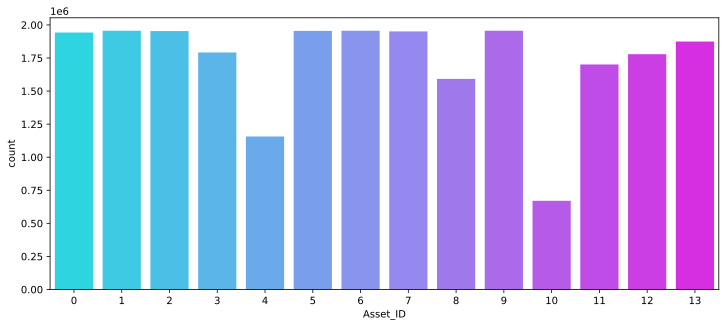

In [ ]:
plt.figure(figsize=(12,5))
sns.countplot(df_train['Asset_ID'], palette='cool')

In [ ]:
asset["weight_percentage"] = (asset["Weight"] / asset["Weight"].sum()) * 100
asset.sort_values("Weight", ascending=False)
fig = px.pie(asset, values='weight_percentage', names='Asset_Name', title='Weights given to each cryptocurrency')
fig.show()

In [ ]:
df_train.describe()

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
count,2.423681e+07,2.423681e+07,2.423681e+07,2.423681e+07,2.423681e+07,2.423681e+07,2.423681e+07,2.423681e+07,2.423680e+07,2.348647e+07
mean,1.577120e+09,6.292544e+00,2.864593e+02,1.432640e+03,1.436350e+03,1.429568e+03,1.432640e+03,2.868530e+05,NaN,7.121752e-06
std,3.323350e+07,4.091861e+00,8.673982e+02,6.029605e+03,6.039482e+03,6.020261e+03,6.029611e+03,2.433935e+06,NaN,5.679042e-03
min,1.514765e+09,0.000000e+00,1.000000e+00,1.170400e-03,1.195000e-03,2.000000e-04,1.171400e-03,-3.662812e-01,-inf,-5.093509e-01
25%,1.549011e+09,3.000000e+00,1.900000e+01,2.676500e-01,2.681600e-01,2.669000e-01,2.676484e-01,1.410725e+02,2.676368e-01,-1.694354e-03
50%,1.578372e+09,6.000000e+00,6.400000e+01,1.428860e+01,1.431250e+01,1.426300e+01,1.428920e+01,1.295415e+03,1.428769e+01,-4.289844e-05
75%,1.606198e+09,9.000000e+00,2.210000e+02,2.288743e+02,2.293000e+02,2.284200e+02,2.288729e+02,2.729764e+04,2.288728e+02,1.601520e-03
max,1.632182e+09,1.300000e+01,1.650160e+05,6.480594e+04,6.490000e+04,6.467053e+04,6.480854e+04,7.597554e+08,inf,9.641699e-01


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24236806 entries, 0 to 24236805
Data columns (total 10 columns):
 #   Column     Dtype  
---  ------     -----  
 0   timestamp  int64  
 1   Asset_ID   int64  
 2   Count      float64
 3   Open       float64
 4   High       float64
 5   Low        float64
 6   Close      float64
 7   Volume     float64
 8   VWAP       float64
 9   Target     float64
dtypes: float64(8), int64(2)
memory usage: 1.8 GB


看一下nan个数

In [ ]:
df_train.isnull().any(axis=0)  # Nan在Target和VWAP中

print(f'length of training set:', len(df_train))
df_train["VWAP"].isnull().sum(), df_train["Target"].isnull().sum()

length of training set: 24236806


(9, 750338)

选择Asset_ID为1的来进行分析探索

In [ ]:
df_train["timestamp"] = pd.to_datetime(df_train["timestamp"], unit='s')
df_train["timestamp"]

0          2018-01-01 00:01:00
1          2018-01-01 00:01:00
2          2018-01-01 00:01:00
3          2018-01-01 00:01:00
4          2018-01-01 00:01:00
                   ...        
24236801   2021-09-21 00:00:00
24236802   2021-09-21 00:00:00
24236803   2021-09-21 00:00:00
24236804   2021-09-21 00:00:00
24236805   2021-09-21 00:00:00
Name: timestamp, Length: 24236806, dtype: datetime64[ns]

In [ ]:
df_ex = df_train[df_train["timestamp"] >= '2021-01-01'].set_index('timestamp', drop=True)
df_ex.shape

(5300895, 9)

观看特征的趋势（折线图）

In [ ]:
df_ex[df_ex['Asset_ID'] == 1][['Count', 'Open', 'High', 'Low', 'Close', 'Volume', 'VWAP', 'Target']].plot(subplots=True, figsize=(15, 25))
plt.show()

查看分布

[[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4b060d2350>


/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning:

invalid value encountered in log10



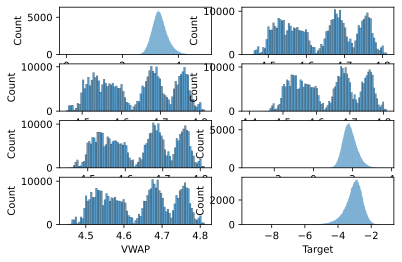

In [ ]:
_, axes = plt.subplots(4, 2)
print(axes)
show_fea = ['Count', 'Open', 'High', 'Low', 'Close', 'Volume', 'VWAP', 'Target']
for name, ax in zip(show_fea, axes.flatten()):
  fig_show = df_ex[df_ex['Asset_ID'] == 1][name]
  sns.histplot(np.log10(fig_show), ax=ax)

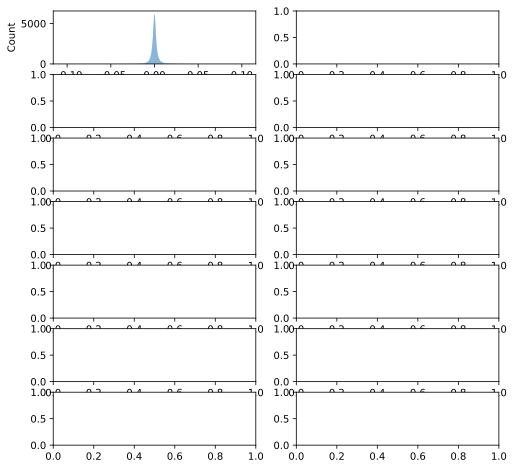

In [ ]:
_, axes = plt.subplots(7, 2, figsize=(8, 8))
for index, ax in zip(asset.index, axes.flatten()):
  sns.histplot(data=df_ex[df_ex['Asset_ID'] == index]["Target"], ax=ax)
  break  # 其实每一个Asset_ID都差不多

热力图，观察协方差

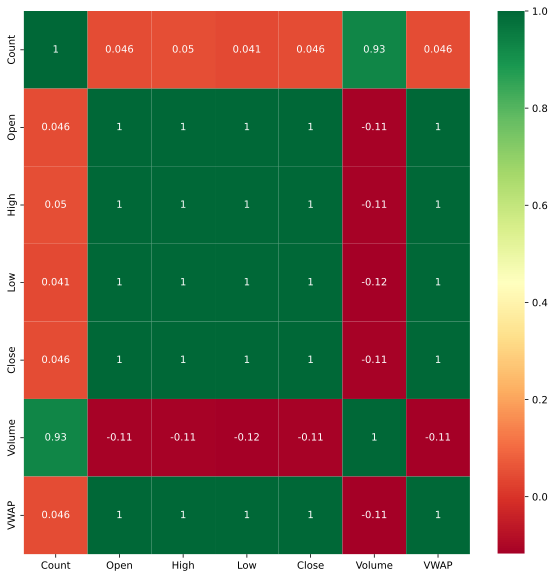

In [ ]:
_, ax = plt.subplots(figsize=(10, 10))
columns = ['Count', 'Open', 'High', 'Low', 'Close', 'Volume', 'VWAP']
sns.heatmap(df_ex[df_ex['Asset_ID'] == 1][columns].corr(), annot=True, cmap='RdYlGn', ax=ax)

### Star & End Time

In [ ]:
asset.reset_index(inplace=True)
asset_names_dict = {row["Asset_Name"]:row["Asset_ID"] for ind, row in asset.iterrows()}

asset_names = [
    'Bitcoin',
    'Ethereum',
    'Cardano',
    'Binance Coin',
    'Dogecoin',
    'Bitcoin Cash',
    'Litecoin',
    'Ethereum Classic',
    'Stellar',
    'TRON',
    'Monero',
    'EOS.IO',
    'IOTA',
    'Maker'
]

time_list = []
for coin in asset_names:
    coin_df = df_train[df_train["Asset_ID"]==asset_names_dict[coin]].set_index("timestamp")
    start_time = coin_df.index[0]
    end_time = coin_df.index[-1]
    time_list.append([coin, start_time, end_time])
time_df = pd.DataFrame(time_list)
time_df.columns = ["Asset_Name", "Start_Time", "End_Time"]
time_df

,Asset_Name,Start_Time,End_Time
0,Bitcoin,2018-01-01 00:01:00,2021-09-21
1,Ethereum,2018-01-01 00:01:00,2021-09-21
2,Cardano,2018-04-17 09:11:00,2021-09-21
3,Binance Coin,2018-01-01 00:01:00,2021-09-21
4,Dogecoin,2019-04-12 14:34:00,2021-09-21
5,Bitcoin Cash,2018-01-01 00:01:00,2021-09-21
6,Litecoin,2018-01-01 00:01:00,2021-09-21
7,Ethereum Classic,2018-01-01 00:01:00,2021-09-21
8,Stellar,2018-02-16 23:53:00,2021-09-21
9,TRON,2018-02-06 21:37:00,2021-09-21


**Inference:**

- 数据中最早的开始日期是 2018 年 1 月 1 日，大多数硬币都有这个开始日期时间。
- 数据有效期至 2021 年 9 月 21 日，所有代币都有相同的结束日期时间。
- Dogecoin 在给定硬币中拥有最少的历史信息，并且从 2019 年 4 月开始捕获。

## Data Proprocessing 数据预处理

* 填充空值

* 处理时间序列(一分钟为单位)

  * 从上面折线图可以看到其曲线振荡较为严重，考虑将其平滑化

### Missing Data Statistics  缺失数据统计

In [ ]:
missing_list = []
for coin in asset_names:
    coin_df = df_train[df_train["Asset_ID"]==asset_names_dict[coin]].set_index("timestamp")
    missing_list.append([coin, coin_df.shape[0]] + coin_df.isna().sum().tolist())
missing_df = pd.DataFrame(missing_list)
missing_df.columns = ["Asset_Name", "TotalRows", 'Missing_Asset_ID', 'Missing_Count', 'Missing_Open', 
                      'Missing_High', 'Missing_Low', 'Missing_Close', 'Missing_Volume', 'Missing_VWAP', 'Missing_Target']
missing_df

,Asset_Name,TotalRows,Missing_Asset_ID,Missing_Count,Missing_Open,Missing_High,Missing_Low,Missing_Close,Missing_Volume,Missing_VWAP,Missing_Target
0,Bitcoin,1956282,0,0,0,0,0,0,0,0,304
1,Ethereum,1956200,0,0,0,0,0,0,0,0,340
2,Cardano,1791867,0,0,0,0,0,0,0,0,18731
3,Binance Coin,1942619,0,0,0,0,0,0,0,0,13415
4,Dogecoin,1156866,0,0,0,0,0,0,0,0,144974
5,Bitcoin Cash,1953537,0,0,0,0,0,0,0,0,4861
6,Litecoin,1956030,0,0,0,0,0,0,0,0,521
7,Ethereum Classic,1951127,0,0,0,0,0,0,0,0,9326
8,Stellar,1778749,0,0,0,0,0,0,0,0,61816
9,TRON,1874560,0,0,0,0,0,0,0,0,21014


**Inference:**
- Bitcoin的缺失目标值最少，Monero最多。
- 我们需要仔细处理这些缺失的目标值。

### Gaps
**这一点往往被人们遗忘，在后续特征工程当中，如果需要利用时序的特征，这一点非常重要！**
- 竞赛中还提到，对于给定的分钟，丢失的资产数据不是由 NaN 表示，而是由这些行的缺失表示。因此，让我们检查数据中的Gaps。

- 我们知道数据每 60 秒收集一次。如果我们在连续的行之间有超过一分钟的间隔，那么它表明之间的数据丢失了。让我们检查每个硬币。

In [ ]:
gap_list = []
for coin in asset_names:
    coin_df = df_train[df_train["Asset_ID"]==asset_names_dict[coin]].set_index("timestamp")
    gap_df = (coin_df.index[1:]-coin_df.index[:-1]).value_counts().reset_index()
    n_gaps = gap_df[gap_df["index"]!=60]["timestamp"].sum()
    max_gap = gap_df["index"].max()
    # max_gap = pd.to_timedelta([max_gap]).astype('timedelta64[s]')[0]
    gap_list.append([coin, n_gaps, max_gap]) 
gap_df = pd.DataFrame(gap_list)
gap_df.columns = ["Asset_Name", "number_of_gaps", "max_gap"]
gap_df

,Asset_Name,number_of_gaps,max_gap
0,Bitcoin,1956281,0 days 00:40:00
1,Ethereum,1956199,0 days 02:00:00
2,Cardano,1791866,0 days 01:20:00
3,Binance Coin,1942618,1 days 09:32:00
4,Dogecoin,1156865,0 days 02:01:00
5,Bitcoin Cash,1953536,0 days 01:13:00
6,Litecoin,1956029,0 days 01:28:00
7,Ethereum Classic,1951126,0 days 01:03:00
8,Stellar,1778748,0 days 02:22:00
9,TRON,1874559,0 days 00:50:00


**Inference:**

- 数据集中有几个gaps，我们需要仔细对待它们
- Maker 币的最大gaps为 281700 秒或约 78 小时
- 当我们在数据中有gaps时，我们无法计算这些差距之后的时间段的回报。我认为这就是我们的数据中缺少目标值的原因。

画图观察每种资产最后价格的情况

In [ ]:
f = plt.figure(figsize=(15,30))
cmap = sns.color_palette()

for ind, coin in enumerate(asset_names):
    coin_df = df_train[df_train["Asset_ID"]==asset_names_dict[coin]].set_index("timestamp")
    # fill missing values 
    all_times = pd.date_range(coin_df.index[0], coin_df.index[-1] + pd.Timedelta(minutes=1), freq = "T")

    coin_df = coin_df.reindex(all_times, method='pad')
    
    ax = f.add_subplot(7,2,ind+1)
    plt.plot(coin_df['Close'], label=coin, color=cmap[ind%10])
    plt.legend()
    plt.xlabel('Time')
    plt.ylabel(coin)
    plt.title(coin)

plt.tight_layout()
plt.show()

### Correlation on actual price values 相关性分析
让我们在这些不同资产的实际价格值上创建一个相关图。
我们选择2021-07-01之后的数据

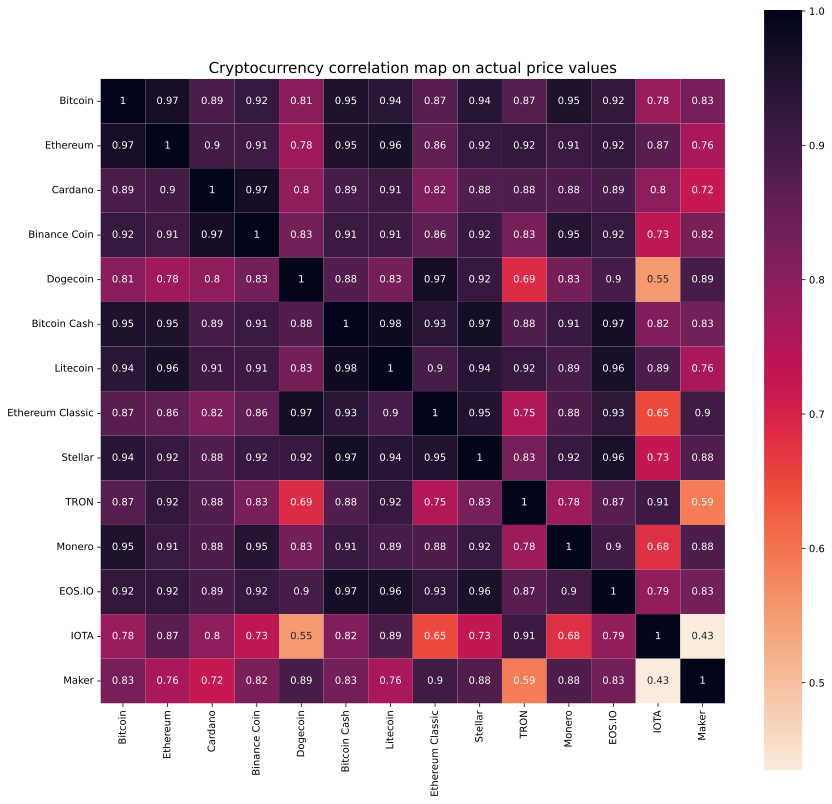

In [ ]:
all_assets_df = pd.DataFrame([])
for ind, coin in enumerate(asset_names):
    coin_df = df_train[df_train["Asset_ID"]==asset_names_dict[coin]].set_index("timestamp")
    coin_df = coin_df[coin_df.index >= '2021-07-01'].reset_index()
    # fill missing values
    close_values = coin_df["Close"].fillna(0)
    close_values.name = coin
    all_assets_df = all_assets_df.join(close_values, how="outer")

corrmat = all_assets_df.corr()
fig, ax = plt.subplots(figsize=(14, 14))
sns.heatmap(corrmat, vmax=1., square=True, annot=True, cmap="rocket_r")
plt.title("Cryptocurrency correlation map on actual price values", fontsize=15)
plt.show()

**Inference:**
* 资产之间的相关性会随着时间而变化，因此需要在构建模型时加以解决。
* IOTA 与其他代币的相关性非常低。
* Bitcoin and Ethereum 仍然表现出高度相关性。


### Correlation over time 相关性随时间变化
在这里，我们展示了相关性如何随着时间的推移在日志返回上发生变化。我们可以只看一下硬币**Bitcoin, Ethereum, Dogecoin and IOTA**，看看相关性如何随着时间的推移而变化。

In [ ]:
from bokeh.models import Panel, Tabs
from bokeh.io import output_notebook, show
from bokeh.plotting import figure

output_notebook()

def log_return(series, periods=1):
    return np.log(series).diff(periods=periods)

def get_plots(df, col1, col2):
    p = figure(plot_width=1000, plot_height=500, title=f"{col1} & {col2} - correlation distribution over time")
    p.line(df['index'], df[col1], alpha=0.7)
    return p

main_tabs_list = []
for coin1 in ['Bitcoin', 'Ethereum', 'Dogecoin', 'IOTA']:
    tab_list = []
    coin_df = df_train[df_train["Asset_ID"]==asset_names_dict[coin1]].set_index("timestamp")
    all_times = pd.date_range(coin_df.index[0], coin_df.index[-1] + pd.Timedelta(minutes=1), freq = "T")
    coin_df = coin_df.reindex(all_times, method='pad')
    return1_values = log_return(coin_df["Close"].fillna(0))[1:]
    return1_values.name = coin1
    for coin2 in asset_names:
        if coin2 != coin1:
            coin_df = df_train[df_train["Asset_ID"]==asset_names_dict[coin2]].set_index("timestamp")
            all_times = pd.date_range(coin_df.index[0], coin_df.index[-1] + pd.Timedelta(minutes=1), freq = "T")
            coin_df = coin_df.reindex(all_times, method='pad')
            return2_values = log_return(coin_df["Close"].fillna(0))[1:]
            return2_values.name = coin2
            two_assets = pd.concat([return1_values, return2_values], axis=1)
            corr_time_df = two_assets.groupby(two_assets.index.values.astype('datetime64[D]')).corr().loc[:,coin1].loc[:,coin2].reset_index()
            p = get_plots(corr_time_df, coin1, coin2)
            tab = Panel(child=p, title=f"Corr:{coin1} & {coin2}")
            tab_list.append(tab)
    tabs = Tabs(tabs=tab_list)
    panel = Panel(child=tabs, title=coin1)
    main_tabs_list.append(panel)
            

tabs = Tabs(tabs=main_tabs_list)
show(tabs)

## 抽取Asset_ID为1的查看

In [ ]:
df_train[df_train['Asset_ID'] == 1]

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
2,2018-01-01 00:01:00,1,229.0,13835.194000,14013.800000,13666.11,13850.176000,31.550062,13827.062093,-0.014643
10,2018-01-01 00:02:00,1,235.0,13835.036000,14052.300000,13680.00,13828.102000,31.046432,13840.362591,-0.015037
18,2018-01-01 00:03:00,1,528.0,13823.900000,14000.400000,13601.00,13801.314000,55.061820,13806.068014,-0.010309
26,2018-01-01 00:04:00,1,435.0,13802.512000,13999.000000,13576.28,13768.040000,38.780529,13783.598101,-0.008999
34,2018-01-01 00:05:00,1,742.0,13766.000000,13955.900000,13554.44,13724.914000,108.501637,13735.586842,-0.008079
...,...,...,...,...,...,...,...,...,...,...
24236739,2021-09-20 23:56:00,1,1940.0,42983.780000,43001.850849,42878.26,42899.012857,56.850913,42935.489499,NaN
24236753,2021-09-20 23:57:00,1,2026.0,42904.197143,42932.000000,42840.16,42860.005714,80.993326,42879.576084,NaN
24236767,2021-09-20 23:58:00,1,1986.0,42859.385714,42887.500000,42797.20,42827.020000,65.677734,42844.090693,NaN
24236781,2021-09-20 23:59:00,1,4047.0,42839.012802,43042.160000,42818.10,43017.277143,138.335477,42935.761938,NaN
